# Assignment 3

In [8]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc


import seaborn as sns

## Task 1: MLE computation

As you know, we can think about linear regression from the optimization point of view (as the problem of minimizing the root mean squared error), but we can also consider it from the probabilistic point of view.
Let's consider the following equation:

\begin{equation*}
y_i=x_i B_0+\varepsilon_i
\end{equation*}

where $y_i$ is the dependent variable, $x_i$ is a $1 \times K$ vector of regressors, $\beta_0$ is the $K \times 1$ vector of regression coefficients to be estimated and $\varepsilon_i$ is an unobservable error term.

The sample is made up of $N$ IID observations $\left(y_i, x_i\right)$.
The regression equations can be also written as

\begin{equation*}
y=X \beta_0+\varepsilon
\end{equation*}

where the $N \times 1$ vector of observations of the dependent variable is denoted by $y$, the $N \times K$ matrix of regressors is denoted by $X$, and the $N \times 1$ vector of error terms is denoted by $\varepsilon$.

As everybody interested in probability theory knows, we always have to have some assumptions. In this case, we assume that the vector of errors $\varepsilon$ has a multivariate normal distribution conditional on $x$, with mean equal to 0 and covariance matrix equal to

\begin{equation*}
\sigma_0^2 I
\end{equation*}

where $l$ is the $N \times N$ identity matrix and

\begin{equation*}
\sigma_0^2=\operatorname{Var}\left[\varepsilon_i \mid X\right]
\end{equation*}

is the second parameter to be estimated.
Furthermore, it is assumed that the matrix of regressors $x$ has full-rank.

Those assumptions have interesting implications:
- the covariance matrix of $\varepsilon$ is diagonal implies that the entries of $\varepsilon$ are mutually independent (i.e., $\varepsilon_i$ is independent of $\varepsilon_j$ for $i \neq j$.)
- they all have a normal distribution with mean 0 and variance $\sigma_0^2$.

The fact that we transform normal random variables linearly makes the dependent variable $y_i$ conditionally normal, with mean $x_i \beta_0$ and variance $\sigma_0^2$. Therefore, its cdf is

\begin{equation*}
f_Y\left(y_i \mid X\right)=\left(2 \pi \sigma_0^2\right)^{-1 / 2} \exp \left(-\frac{1}{2} \frac{\left(y_i-x_i \beta_0\right)^2}{\sigma_0^2}\right)
\end{equation*}

Having this probability model we can use it to do estimation of regression parameters using Maximum Likelihood Estimation method.

The first-order conditions for a maximum are

\begin{equation*}
\begin{aligned}
& \nabla_\beta l\left(\beta, \sigma^2 ; y, X\right)=0 \\
& \frac{\partial}{\partial \sigma^2} l\left(\beta, \sigma^2 ; y, X\right)=0
\end{aligned}
\end{equation*}

where $\nabla_\beta$ indicates the gradient calculated with respect to $\beta$, that is, the vector of the partial derivatives of the log-likelihood with respect to the entries of $\beta$. The gradient is

\begin{equation*}
\begin{aligned}
& \nabla_\beta l\left(\beta, \sigma^2: y, X\right) \\
= & \nabla_\beta\left(-\frac{N}{2} \ln (2 \pi)-\frac{N}{2} \ln \left(\sigma^2\right)-\frac{1}{2 \sigma^2} \sum_{i=1}^N\left(y_i-x_i \beta\right)^2\right) \\
= & \frac{1}{\sigma^2} \sum_{i=1}^N x_i^{\top}\left(y_i-x_i \beta\right) \\
= & \frac{1}{\sigma^2}\left(\sum_{i=1}^N x_i^{\top} y_i-\sum_{i=1}^N x_i^{\top} x_i \beta\right)
\end{aligned}
\end{equation*}

which is equal to zero only if

\begin{equation*}
\sum_{i=1}^N x_i^{\top} y_i-\sum_{i=1}^N x_i^{\top} x_i \beta=0
\end{equation*}


Therefore, the first of the two equations is satisfied if

\begin{equation*}
\beta=\left(\sum_{i=1}^N x_i^{\top} x_i\right)^{-1} \sum_{i=1}^N x_i^{\top} y_i=\left(X^{\top} X\right)^{-1} X^{\top} y
\end{equation*}

where we have used the assumption that $x$ has full rank and, as a consequence, $x^x x$ is invertible.


### Subtask A:
Prove that the MLE for variance is equal to
$$
\widehat{\sigma}_n^2=\frac{1}{N} \sum_{i=1}^N\left(y_i-x_i \widehat{\beta}_N\right)^2
$$

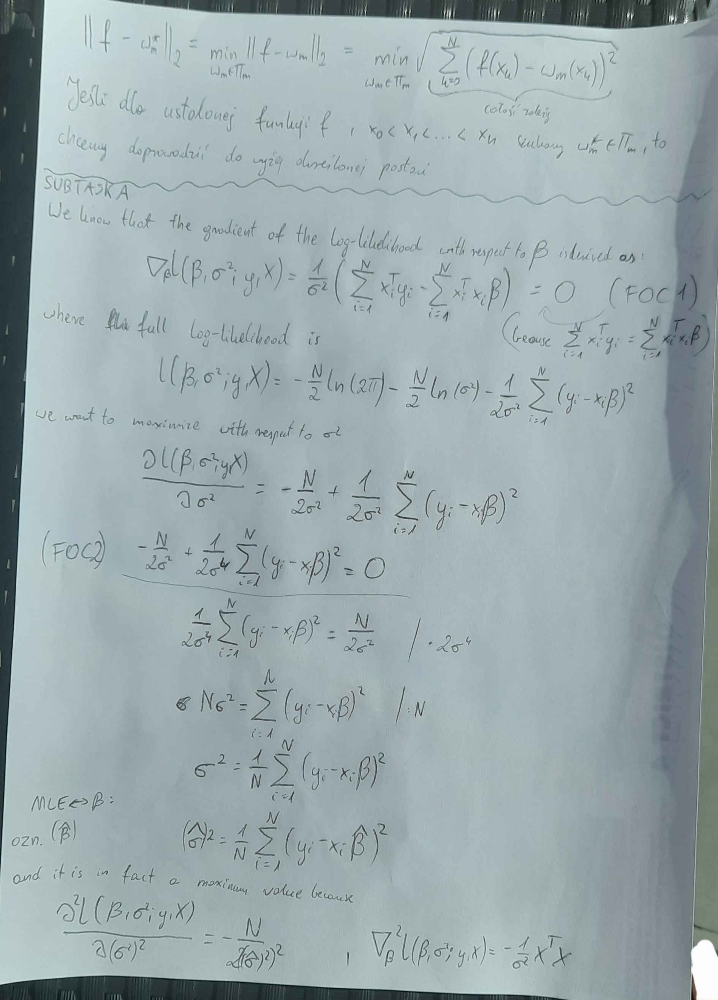

### MLE for Logistic regression

In the logistic regression model, the output variable $y_i$ is a Bernoulli random variable (it can take only two values, either 1 or 0 ) and

\begin{equation*}
\mathrm{P}\left(y_i=1 \mid x_i\right)=S\left(x_i \beta\right)
\end{equation*}

where

\begin{equation*}
S(t)=\frac{1}{1+\exp (-t)}
\end{equation*}

is the logistic function, $x_i$ is a $1 \times K$ vector of inputs and $\beta$ is a $K \times 1$ vector of coefficients.

Furthermore,

\begin{equation*}
\mathrm{P}\left(y_i=0 \mid x_i\right)=1-S\left(x_i \beta\right)
\end{equation*}


The vector of coefficients $\beta$ is the parameter to be estimated by maximum likelihood.
We assume that the estimation is carried out with an IID sample comprising $N$ data points

\begin{equation*}
\left(y_i, x_i\right) \text { for } i=1, \ldots, N
\end{equation*}

### Subtask B
1. Find the form of the loglikelihood.
2. Compute the gradient of logistic function with respect to $\beta$

You can either tex your solution and put it in this notebook or attach photos of your solution.

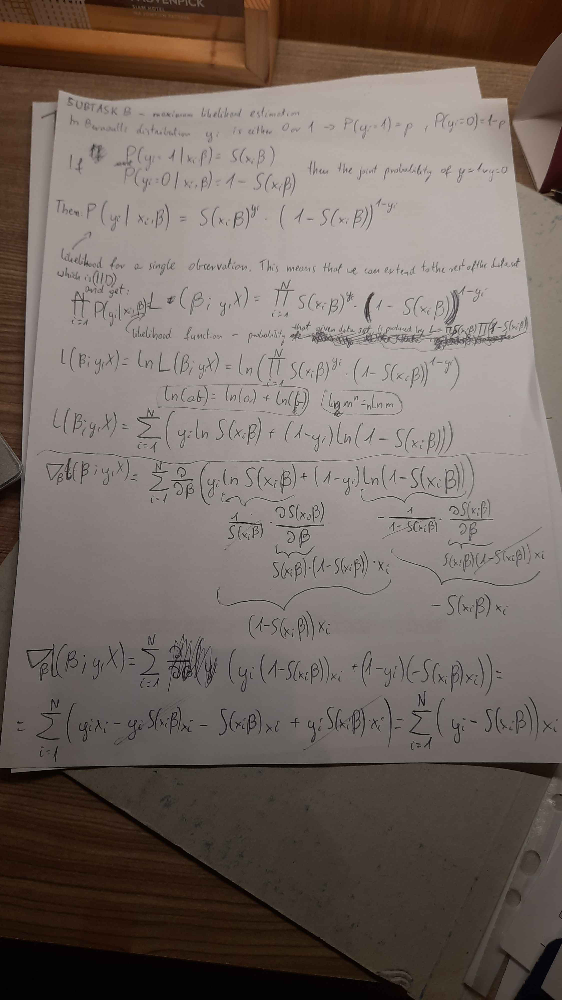

## Task 2: Implement Logistic Regression

Use derivations form previous task to perform logistic regression. Provide a custom implemntation of gradient descent for this taks.
**Bonus points** provide also implementation of other optimization algorithm of your choice, eg. Newton-Rhapson method.


In [9]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def logistic_regression_gradient_descent(X, y, learning_rate=0.01, max_iter=1000, tol=1e-6):
    """
    Perform logistic regression using gradient descent, based on Task 1 derivations.

    Parameters:
        X (ndarray): Design matrix (N x K).
        y (ndarray): Response vector (N,).Solving Logistic Regression with Newton's
        learning_rate (float): Step size for gradient descent.
        max_iter (int): Maximum number of iterations.
        tol (float): Convergence tolerance for gradient norm.

    Returns:
        beta (ndarray): Estimated coefficients (K,).
        history (list): Negative log-likelihood values during training.
    """
    N, K = X.shape
    beta = np.zeros(K)
    history = []  

    for iteration in range(max_iter):

        linear_combination = np.dot(X, beta)
        predictions = sigmoid(linear_combination)

        neg_log_likelihood = -np.sum(y * np.log(predictions + 1e-9) + (1 - y) * np.log(1 - predictions + 1e-9)) # log likelihood for convergence
        history.append(neg_log_likelihood)

        gradient = (1 / N) * np.dot(X.T, predictions - y) # (task 1)

        beta -= learning_rate * gradient
        
        if np.linalg.norm(gradient) < tol:
            print(f"Converged after {iteration + 1} iterations.")
            break

    return beta, history

In [10]:
def logistic_regression_newton_raphson(X, y, max_iter=100, tol=1e-6):
    """
    Perform logistic regression using the Newton-Raphson method.

    Parameters:
        X (ndarray): Design matrix (N x K).
        y (ndarray): Response vector (N,).
        max_iter (int): Maximum number of iterations.
        tol (float): Convergence tolerance for gradient norm.

    Returns:
        beta (ndarray): Estimated coefficients (K,).
        history (list): Log-likelihood values during training.
    """
    N, K = X.shape
    beta = np.zeros(K)  
    history = []

    for iteration in range(max_iter):
        
        linear_combination = np.dot(X, beta)
        predictions = sigmoid(linear_combination)

        gradient = np.dot(X.T, y - predictions)

      
        W = np.diag(predictions * (1 - predictions))   # Weight matrix W (diagonal matrix of S(x_i beta) * (1 - S(x_i beta)))

        hessian = -np.dot(X.T, np.dot(W, X))

        beta_update = np.linalg.solve(hessian, gradient)  # Solve H * update = gradient
        beta -= beta_update

        log_likelihood = np.sum(y * np.log(predictions + 1e-9) + (1 - y) * np.log(1 - predictions + 1e-9))
        history.append(log_likelihood)

        if np.linalg.norm(beta_update) < tol:
            print(f"Converged after {iteration + 1} iterations.")
            break

    return beta, history

In [11]:
np.random.seed(0)
N = 100  # Number of samples
K = 2    # Number of features

X = np.random.rand(N, K)
X = np.hstack((np.ones((N, 1)), X))

true_beta = np.array([0.5, 2, -1])
logits = np.dot(X, true_beta)
probabilities = sigmoid(logits)
y = np.random.binomial(1, probabilities)

estimated_beta, log_likelihood_history = logistic_regression_gradient_descent(X, y, learning_rate=0.1, max_iter=1000)

print("Estimated coefficients:", estimated_beta)
print("Log-likelihood history:", log_likelihood_history)

Estimated coefficients: [ 0.63316541  1.70177347 -1.21896766]
Log-likelihood history: [np.float64(69.31471785599452), np.float64(68.69160279598731), np.float64(68.11379739287477), np.float64(67.5778898491201), np.float64(67.08071125415621), np.float64(66.61932240824481), np.float64(66.19100044870775), np.float64(65.79322551596259), np.float64(65.42366764461786), np.float64(65.08017402041733), np.float64(64.76075670648723), np.float64(64.46358091143804), np.float64(64.1869538466537), np.float64(63.929314199819544), np.float64(63.68922223568403), np.float64(63.46535052255856), np.float64(63.256475273547814), np.float64(63.06146828444117), np.float64(62.87928944513843), np.float64(62.708979798035365), np.float64(62.54965511463328), np.float64(62.400499960484844), np.float64(62.26076221821809), np.float64(62.129748038607154), np.float64(62.00681719032652), np.float64(61.89137878001665), np.float64(61.78288731550126), np.float64(61.680839086355796), np.float64(61.58476883747073), np.float64

In [12]:
# Perform logistic regression using Newton-Raphson
estimated_beta, log_likelihood_history = logistic_regression_newton_raphson(X, y, max_iter=100)

print("Estimated coefficients:", estimated_beta)
print("Log-likelihood history:", log_likelihood_history)

Converged after 5 iterations.
Estimated coefficients: [ 0.68691686  2.05087383 -1.61757017]
Log-likelihood history: [np.float64(-69.31471785599452), np.float64(-55.91741602767757), np.float64(-55.56076308222229), np.float64(-55.55840159958149), np.float64(-55.55840146036643)]


## Task 3: Classification for Imbalanced Data

Split the data using a technique suitable for imbalanced classes. Describe its working.

Train a logistic regression model on the below data.

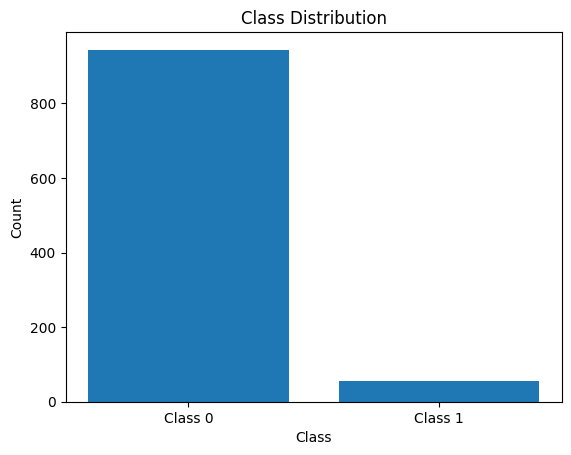

Dataset Shape: (1000, 20)
Class Distribution: [944  56]


In [13]:

# Create a synthetic dataset
X, y = make_classification(
    n_samples=1000,
    n_informative=4, n_redundant=5, n_features=20, n_clusters_per_class=3,
    n_classes=2,
    weights=[0.95, 0.05],
    random_state=42
)

# Visualize class distribution
def visualize_class_distribution(y):
    plt.bar(['Class 0', 'Class 1'], [sum(y == 0), sum(y == 1)])
    plt.title("Class Distribution")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.show()

visualize_class_distribution(y)

# Summarize dataset
print("Dataset Shape:", X.shape)
print("Class Distribution:", np.bincount(y))



Evaluate your binary classifiers using the following:
- confusion matrix,
- accuracy,
- precision,
- recall,
- F1 score,
- ROCAUC.

Please write custom functions calculating the above functions and plotting the receiver operating characteristic curve. Describe your intuition behind each metric and its suitability for imbalanced classes.



In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

In [15]:
model = LogisticRegression(random_state=42, solver='liblinear')
model.fit(X_train, y_train)

LogisticRegression(random_state=42, solver='liblinear')

In [16]:
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

In [17]:
def confusion_matrix_custom(y_true, y_pred):
    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))
    return np.array([[TN, FP], [FN, TP]])

In [18]:
def accuracy_custom(y_true, y_pred):
    return np.mean(y_true == y_pred)

In [19]:
def precision_custom(y_true, y_pred):
    TP = np.sum((y_true == 1) & (y_pred == 1))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    return TP / (TP + FP) if (TP + FP) > 0 else 0

In [20]:
def recall_custom(y_true, y_pred):
    TP = np.sum((y_true == 1) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))
    return TP / (TP + FN) if (TP + FN) > 0 else 0


In [21]:
def f1_score_custom(y_true, y_pred):
    precision = precision_custom(y_true, y_pred)
    recall = recall_custom(y_true, y_pred)
    return 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0


Confusion matrix:

TN: True Negatives (correctly classified majority class).

FP: False Positives (majority class misclassified as minority).

FN: False Negatives (minority class misclassified as majority).

TP: True Positives (correctly classified minority class).

In [22]:
# Confusion Matrix
conf_matrix = confusion_matrix_custom(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

Confusion Matrix:
 [[282   1]
 [ 11   6]]


Accuracy measures the overall correctness of the model by calculating the proportion of correct predictions (both true positives and true negatives) to the total number of predictions.

Accuracy = (TP + TN) / (TP + TN + FP + FN)

In such imbalanced data as we have in this example, the majority class may dominate the predictions. If 95% of the instances belong to class 0 (majority class) and 5% belong to class 1 (minority class), a model that always predicts class 0 will achieve 95% accuracy.

In [23]:
# Accuracy
accuracy = accuracy_custom(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.96


Precision is the proportion of true positive predictions relative to all the instances that the model classified as positive.

Precision = TP/(TP+FP)

In this case of majority class being way bigger than minority, high precision means that most of the instances the model classified as positive are truly positive, whereas low precision means that many instances classified as positive are actually false positives.

In [24]:
# Precision
precision = precision_custom(y_test, y_pred)
print("Precision:", precision)

Precision: 0.8571428571428571


Recall is just the proportion of true positives to all positive cases.

Recall = TP/(TP+FN)

In this case of imbalanced data, low recall means that many of the positive instances were missed (false negatives)

In [25]:
# Recall
recall = recall_custom(y_test, y_pred)
print("Recall:", recall)

Recall: 0.35294117647058826


F1 score balances out precision and recall

F1 score = 2 * Precision * Recall / (Precision + Recall)

it is useful with imbalanced data because it's a metric that considers both precision and recall simultaneously so you can use a single metric

In [26]:
# F1 Score
f1 = f1_score_custom(y_test, y_pred)
print("F1 Score:", f1)

F1 Score: 0.5


ROC (Receiver Operating Characteristic) Curve helps visualize the trade-off between true positive rate (recall) and false positive rate across different threshold values. Each point on it corresponds to a different decision threshold. As the threshold changes, the number of true positives and false positives changes, and so do the rates.

AUC (Area Under the ROC Curve) quantifies the overall performance of the classifier across all possible thresholds. A higher AUC (closer to 1) indicates better performance.

In [27]:
# ROCAUC
roc_auc = roc_auc_score(y_test, y_proba)
print("ROC-AUC:", roc_auc)

ROC-AUC: 0.7112866347952609


In [28]:
def plot_roc_curve(y_true, y_proba):
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)
    plt.title("Receiver Operating Characteristic Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

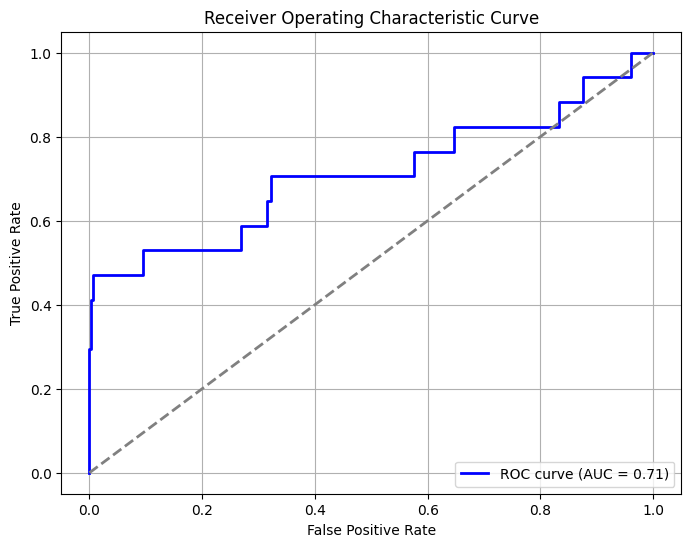

In [29]:
plot_roc_curve(y_test, y_proba)

Propose, describe and implement a technique for improving the model's ability to distinguish the classes. Evaluate your approach.

In [30]:
threshold = 0.4
y_pred_adjusted = (y_proba >= threshold).astype(int)

acc_adjusted = accuracy_custom(y_test, y_pred_adjusted)
recall_adjusted = recall_custom(y_test, y_pred_adjusted)
precision_adjusted = precision_custom(y_test, y_pred_adjusted)
f1_adjusted = f1_score_custom(y_test, y_pred_adjusted)
roc_auc_adjusted = roc_auc_score(y_test, y_proba)

print(f"Adjusted Accuracy: {acc_adjusted:.4f}")
print(f"Adjusted Precision: {precision_adjusted:.4f}")
print(f"Adjusted Recall: {recall_adjusted:.4f}")
print(f"Adjusted F1 Score: {f1_adjusted:.4f}")
print(f"Adjusted ROC-AUC: {roc_auc_adjusted:.4f}")

Adjusted Accuracy: 0.9633
Adjusted Precision: 0.8750
Adjusted Recall: 0.4118
Adjusted F1 Score: 0.5600
Adjusted ROC-AUC: 0.7113


The default threshold for classifiers such as Logistic Regression is 0.5, meaning the model predicts Class 1 if the probability of Class 1 is greater than or equal to 0.5, and Class 0 if it's greater than that. 

When working with imbalanced datasets where the positive class (minority class) is underrepresented, this threshold often can be adjusted for optimization.

**Other things I tried - SMOTE to balance the classes by oversampling the minority class**

In [31]:
from imblearn.over_sampling import SMOTE

In [32]:
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [33]:
model = LogisticRegression(class_weight='balanced', random_state=42)
model.fit(X_train_res, y_train_res)

LogisticRegression(class_weight='balanced', random_state=42)

In [34]:
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

In [35]:
# Evaluate the model

cm = confusion_matrix_custom(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

accuracy = accuracy_custom(y_test, y_pred)
precision = precision_custom(y_test, y_pred)
recall = recall_custom(y_test, y_pred)
f1 = f1_score_custom(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

Confusion Matrix:
[[223  60]
 [  9   8]]


Accuracy: 0.7700
Precision: 0.1176
Recall: 0.4706
F1 Score: 0.1882
ROC-AUC: 0.6824


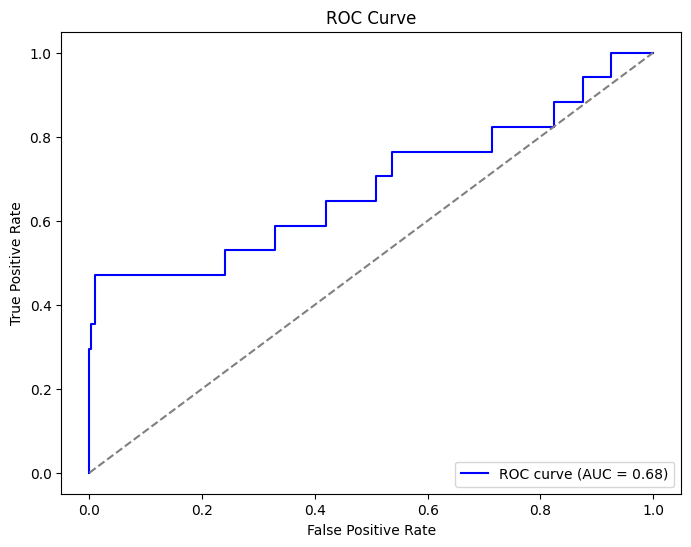

In [36]:
# Display the results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

## Task 4: Optimization of Neural Networks

The **backpropagation algorithm** is the foundational algorithm in deep learning. In this task You will have to go through a single iteration of said algorithm and compare the results after updating networks weights. <br>
You are given a neural network with one input layer consisting of two input nodes ${n_1, n_2}$, one hidden layer with two neurons ${n_3, n_4}$ and an output layer with a single node $n_5$. We will denote the weight connecting $n_i$ to $n_j$ as $w_{i,j}$. A bias related to $n_i$ will be denoted as $b_i$. Parameters are initialized as follows:
* $w_{1,3} = 1.5$ ; $w_{2,3} = -2.5$ ; $b_{3} = 0.3$
* $w_{1,4} = 1$ ; $w_{2,4} = -2.5$ ; $b_{4} = 0.2$
* $w_{3,5} = 4$ ; $w_{4,5} = 3$ ; $b_{5} = -0.8$ <br>

Additionally, neurons $n_3$ and $n_4$ are equipped with the sigmoid activation function: $\sigma(x) = \frac{1}{1+e^{-x}} $<br>
Your task is to use two training examples: $x = \{ (1,2), (2,0)\}$, $y = \{-1, 6\}$ to preform a single backpropagation step - preform forward calculations and propagate the received error backwards, updating the weights. After all weights have been updated, check how the predictions change, preforming additional forward pass.

In [37]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return sigmoid(x) * (1 - sigmoid(x))

w13, w23, b3 = 1.5, -2.5, 0.3
w14, w24, b4 = 1, -2.5, 0.2
w35, w45, b5 = 4, 3, -0.8

n1_n2 = [(1, 2), (2, 0)]
y = [-1, 6]

learning_rate = 0.1

FORWARD PROPAGATION - we start by going forward from input layer to output layer:

hidden layer computations are as follows:

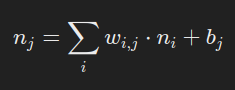

where we tweak the inputs with weights and biases,

then pass them through an activation function - in this case it's sigmoid. It's going to make our weighted sums no longer linear. It's defined as:

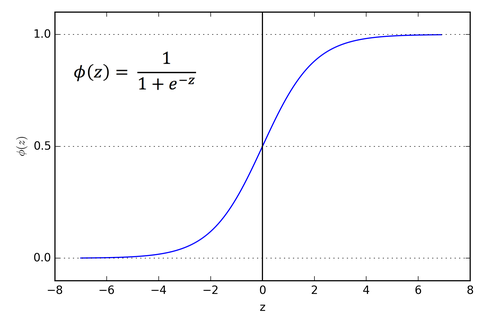

to finally make the final calculations in the output layer

In [38]:
def forward_pass(n1, n2):
    n3 = w13 * n1 + w23 * n2 + b3
    n4 = w14 * n1 + w24 * n2 + b4
    a3 = sigmoid(n3)
    a4 = sigmoid(n4)

    # output layer
    n5 = w35 * a3 + w45 * a4 + b5
    a5 = n5  # linear activation function
    return n3, n4, a3, a4, n5, a5

BACKWARD PROPAGATION - now we'll go back from the output layer to the inout layer:

first we define what kind of loss we're gonna use

then we compute the gradients(partial derivatives) of:

first the weights and biases connected to the output layer - in our case w35,w45,b5

then we go back to the hidden layer - in our case to the n3, n4 neurons

we then update weights and biases using gradients and learning rate in such fasion:

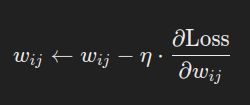

where η is the learning rate

In [39]:
## for each training exapmle
for i in range(len(n1_n2)):
    n1, n2 = n1_n2[i]
    target = y[i]

    # forward propagation
    n3, n4, a3, a4, n5, a5 = forward_pass(n1, n2)


    # --------------------------------------------------------- Backpropagation ---------------------------------------------------------

    loss = a5 - target
    dn5 = loss

    # gradients for weights and biases in output layer (n5)
    dw35 = dn5 * a3
    dw45 = dn5 * a4
    db5 = dn5

    # gradients for hidden layer neurons (n3, n4)
    da3 = dn5 * w35
    da4 = dn5 * w45
    
    dn3 = da3 * sigmoid_derivative(n3)  # gradient for n3
    dn4 = da4 * sigmoid_derivative(n4)  # gradient for n4


    # gradients for the hidden layer weights and biases (w13​,w23​,b3​ and w14,w24,b4)
    dw13 = dn3 * n1
    dw23 = dn3 * n2
    db3 = dn3

    dw14 = dn4 * n1
    dw24 = dn4 * n2
    db4 = dn4

    # finally we can finish by pudating the weights and biases with the acquired gragients and learning rate
    w13 -= learning_rate * dw13
    w23 -= learning_rate * dw23
    b3 -= learning_rate * db3

    w14 -= learning_rate * dw14
    w24 -= learning_rate * dw24
    b4 -= learning_rate * db4

    w35 -= learning_rate * dw35
    w45 -= learning_rate * dw45
    b5 -= learning_rate * db5

    print(f"for training example {i + 1}:")
    print(f"w13: {w13}, w23: {w23}, b3: {b3}")
    print(f"w14: {w14}, w24: {w24}, b4: {b4}")
    print(f"w35: {w35}, w45: {w45}, b5: {b5}\n")

print("final pass to check:")
for i in range(len(n1_n2)):
    n1, n2 = n1_n2[i]
    _, _, _, _, _, a5 = forward_pass(n1, n2)
    print(f"Input: ({n1}, {n2}), Prediction: {a5}")

for training example 1:
w13: 1.4936431406749107, w23: -2.5127137186501787, b3: 0.29364314067491065
w14: 0.9972884766478138, w24: -2.5054230467043723, b4: 0.19728847664781382
w35: 3.99834600526961, w45: 2.999075939259173, b5: -0.8422306703995449

for training example 2:
w13: 1.5017696826342153, w23: -2.5127137186501787, b3: 0.2977064116545629
w14: 1.013066771802244, w24: -2.5054230467043723, b4: 0.2051776242250289
w35: 4.02639466506378, w45: 3.0252546633765536, b5: -0.8131275689084478

final pass to check:
Input: (1, 2), Prediction: -0.5926392426455447
Input: (2, 0), Prediction: 5.802099766945859


## Task 5: L1 & L2 Regularization for Logistic Regression

In this task we will use a synthetic dataset generated by the function `make_classification`.

1. Use a pairplot to see the relationships between the features in the dataset.
2. Apply your logistic regression model from Task 1 on this dataset and measure its accuracy.
3. Modify your implementation to account for two regularization methods: L1 and L2 and apply them to the dataset. What can you observe?
4. Which features are selected by L1 regularization? Plot the decision boundary for these features.

(If you have not done Task 1, use `LogisticRegression` from `sklearn` to see the effects of regularization. You can get half of the points for this task if you do that.)

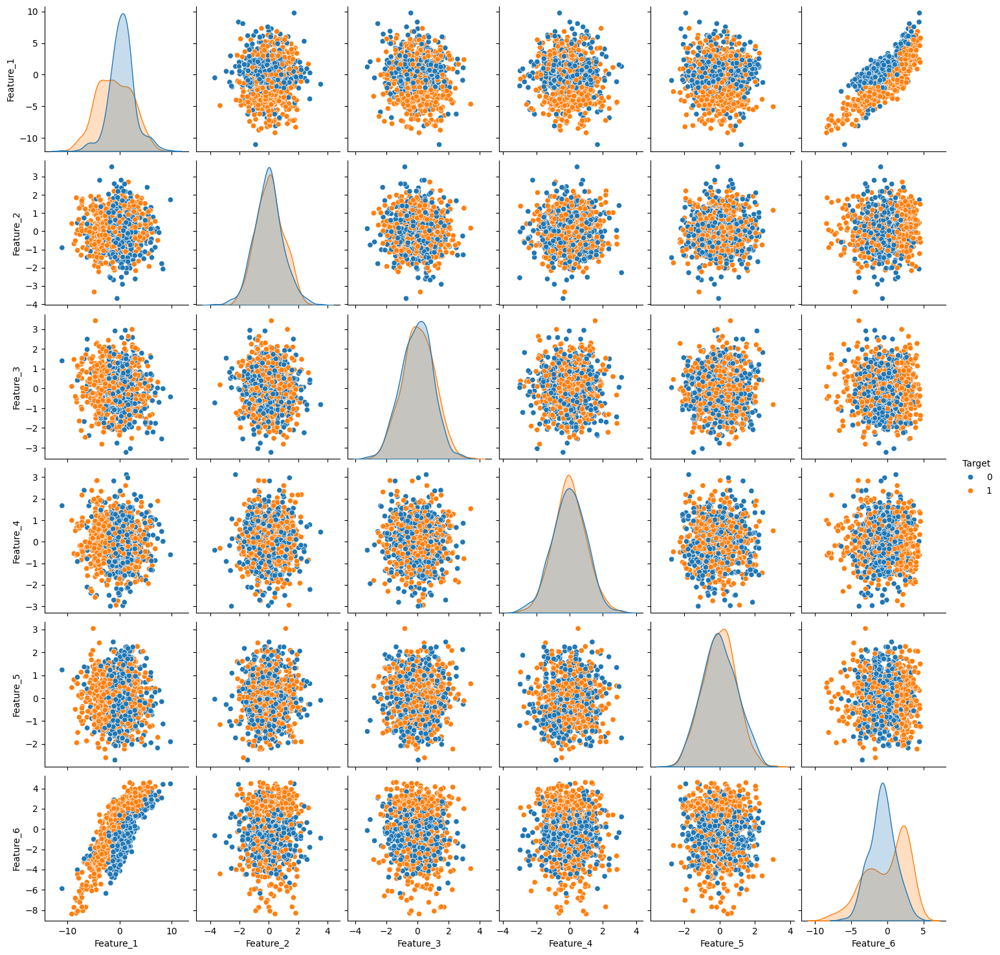

In [40]:
X, y = make_classification(
    n_samples=1000,
    n_features=20,
    n_informative=5,
    n_redundant=5,
    n_classes=2,
    random_state=42
)
dataset = pd.DataFrame(X, columns=[f"Feature_{i}" for i in range(1, 21)])
dataset['Target'] = y

sns.pairplot(dataset.iloc[:, :6].join(dataset['Target']), hue="Target")
plt.show()

In [41]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def logistic_gradient(X, y, beta):
    predictions = sigmoid(X @ beta)
    return X.T @ (predictions - y)

def gradient_descent_log_likelihood(X, y, learning_rate=0.01, max_iter=1000, tol=1e-6):
    beta = np.zeros(X.shape[1])
    for _ in range(max_iter):
        gradient = logistic_gradient(X, y, beta)
        beta -= learning_rate * gradient
        if np.linalg.norm(gradient) < tol:
            break
    return beta

X_train_aug = np.c_[X_train, np.ones(X_train.shape[0])]
X_test_aug = np.c_[X_test, np.ones(X_test.shape[0])]

beta_ = gradient_descent_log_likelihood(X_train_aug, y_train)

pred_ = (sigmoid(X_test_aug @ beta_) >= 0.5).astype(int)

accuracy_task1 = accuracy_score(y_test, pred_)

print("Accuracy:", accuracy_task1)
print("Coefficients:", beta_)


Accuracy: 0.96
Coefficients: [-2.81832902e-01  7.71962324e-01 -2.85771705e-01  1.69509166e-01
  6.14341110e-01 -4.87616961e-01  4.18507678e-01  1.48110072e-01
  7.62958773e-01 -6.58294359e-02 -1.32031221e-01  1.50039681e-01
 -3.64915854e-03  1.13812061e+00  5.93892296e-01 -7.77339730e-02
 -9.00204294e-02 -6.96079341e-01  4.44602823e-01  3.55317899e-01
 -3.89816670e+00]


In [42]:
def gradient_descent_regularized(X, y, learning_rate=0.01, max_iter=1000, tol=1e-6, l1=0.0, l2=0.0):
    beta = np.zeros(X.shape[1])
    for _ in range(max_iter):
        predictions = sigmoid(X @ beta)
        gradient = X.T @ (predictions - y)
        gradient += l1 * np.sign(beta) + l2 * beta  # L1, L2
        beta -= learning_rate * gradient
        if np.linalg.norm(gradient) < tol:
            break
    return beta


beta_l1_reg = gradient_descent_regularized(X_train_aug, y_train, learning_rate=0.01, l1=0.1)
beta_l2_reg = gradient_descent_regularized(X_train_aug, y_train, learning_rate=0.01, l2=0.1)

pred_l1_reg = (sigmoid(X_test_aug @ beta_l1_reg) >= 0.5).astype(int)
pred_l2_reg = (sigmoid(X_test_aug @ beta_l2_reg) >= 0.5).astype(int)

accuracy_l1_reg = accuracy_score(y_test, pred_l1_reg)
accuracy_l2_reg = accuracy_score(y_test, pred_l2_reg)

threshold = 1.1
selected_features_l1 = np.where(np.abs(beta_l1_reg[:-1]) > threshold)[0]

print("Accuracy with L1 regularization:", accuracy_l1_reg)
print("Coefficients with L1 regularization:", beta_l1_reg)
print("Selected features by L1 regularization:", selected_features_l1)

print("\nAccuracy with L2 regularization:", accuracy_l2_reg)
print("Coefficients with L2 regularization:", beta_l2_reg)

Accuracy with L1 regularization: 0.96
Coefficients with L1 regularization: [-2.50791446e-01  1.16929792e+00 -3.47437777e-01  1.56513772e-01
  8.13617981e-01 -5.09207621e-01  3.24736172e-01  1.82817683e-01
  1.03391842e+00  1.85317462e-04  8.80191236e-04  1.91052841e-01
 -1.04467789e-01  1.49618797e+00  7.32139204e-01 -1.48683093e-02
  1.32147678e-01 -6.29569671e-01  8.18085498e-01  4.35251145e-01
 -4.99499770e+00]
Selected features by L1 regularization: [ 1 13]

Accuracy with L2 regularization: 0.96
Coefficients with L2 regularization: [-0.34967373  1.15568175 -0.33863898  0.26851209  0.81403442 -0.59503175
  0.53161482  0.18579253  1.02478838 -0.02152221 -0.15613882  0.17337488
 -0.03893663  1.50694694  0.79734835 -0.12080133 -0.15808294 -0.92801037
  0.51862567  0.49550558 -4.91163755]


We can observe that L1 or L2 reg didnt impact model's accuracy metric much(depending on hyperparameters selected these varied slightly around 0.96) and still was able to change coefficient values

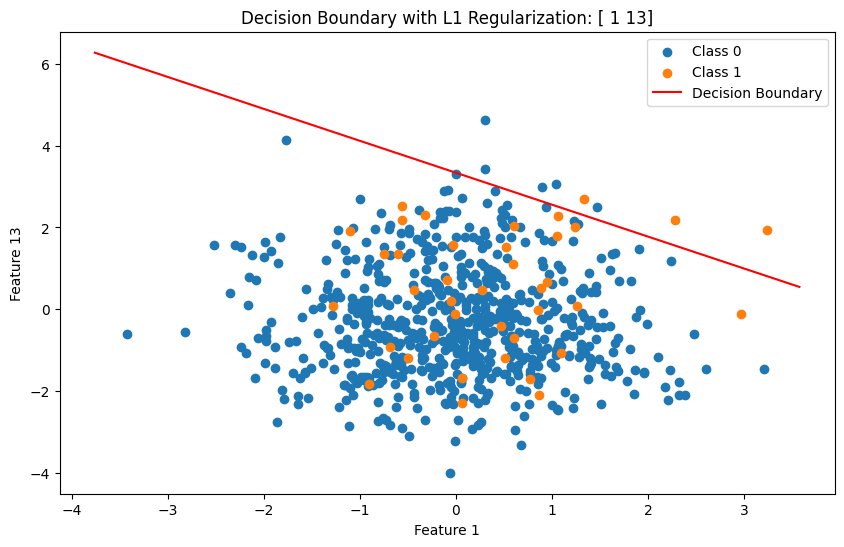

In [43]:
feature_1, feature_2 = selected_features_l1 # Selected features by L1 reg

plt.figure(figsize=(10, 6))
for label in np.unique(y_train):
    plt.scatter(
        X_train[y_train == label, feature_1],
        X_train[y_train == label, feature_2],
        label=f"Class {label}"
    )

x_min, x_max = plt.xlim()
x_values = np.linspace(x_min, x_max, 100)
y_values = -(beta_l1_reg[feature_1] * x_values + beta_l1_reg[-1]) / beta_l1_reg[feature_2]

plt.plot(x_values, y_values, color='red', label='Decision Boundary')
plt.xlabel(f"Feature {feature_1}")
plt.ylabel(f"Feature {feature_2}")
plt.legend()
plt.title(f"Decision Boundary with L1 Regularization: {selected_features_l1}")
plt.show()
